<a href="https://colab.research.google.com/github/BernasconiLorenzo06/verifiche-corrette/blob/main/VerificaGeoPandasLorenzoBernasconi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. caricare le informazioni presenti nei file allegati in opportuni geodataframe (autostrade, province) e visualizzarle. Analizzare nel dettaglio le informazioni presenti prima di continuare con gli esercizi

In [ ]:
!pip install geopandas

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
autostrade = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Autostrade_10000_CT10_line.zip")
province = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/ProvCM01012022_g")

In [ ]:
autostrade

,TS_EID,COD_PE,PERCORSO,geometry
0,19.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (496352.634 4981573.415, 496378.384..."
1,18.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580517.421 4994637.417, 580735.915..."
2,21.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580524.796 4994628.417, 580745.039..."
3,65.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (521699.514 5024872.823, 521630.139..."
4,62.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (504384.530 5044095.266, 504414.405..."
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519364.775 5030574.241, 519401.151..."
6,78.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519346.650 5030596.741, 519377.151..."
7,7.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519364.775 5030574.241, 519352.525..."
8,8.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519346.650 5030596.741, 519337.900..."
9,1922.0,A8,AUTOSTRADA MILANO- VARESE,"LINESTRING (485557.854 5069342.204, 485588.231..."


In [ ]:
province

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,539249.811270,6.828137e+09,"POLYGON ((411015.006 5049970.983, 411266.039 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,418078.067821,2.082097e+09,"POLYGON ((438328.612 5087208.215, 439028.888 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,250242.030547,1.341318e+09,"POLYGON ((460929.542 5076320.298, 461165.259 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,490393.181826,6.898501e+09,"MULTIPOLYGON (((378673.492 4958865.159, 378928..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,315844.562279,1.508889e+09,"POLYGON ((425041.329 4997628.309, 424948.989 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,300316.961132,2.262145e+09,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08,"POLYGON ((519754.706 5065242.380, 520199.702 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,198719.647711,8.620015e+08,"POLYGON ((884760.019 4804406.440, 885511.011 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,237762.889058,1.542032e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


2. visualizzare la mappa delle autostrade

In [ ]:
autostrade.crs

In [ ]:
autostrade3857 = autostrade.to_crs(3857)

In [ ]:
!pip install contextily

In [ ]:
import contextily as ctx

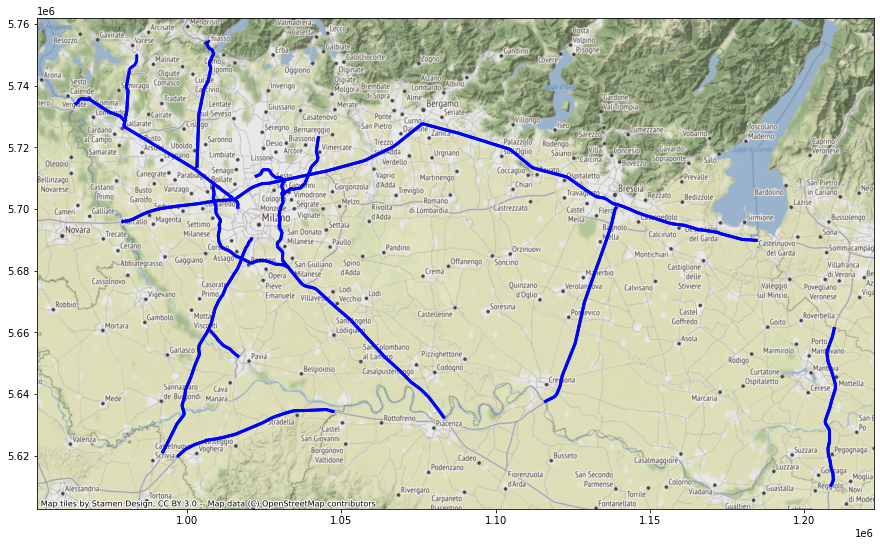

In [ ]:
ax = autostrade3857.plot(figsize = (15, 12), edgecolor = "blue", linewidth = 3)
ctx.add_basemap(ax)

3. visualizzare il numero di autostrade presenti in una certa provincia della Lombardia inserita dall'utente

In [ ]:
province3857 = province.to_crs(3857)

In [ ]:
provincia_selezionata = province3857[province3857["DEN_UTS"] == input("inserire una provincia: ")].geometry.item()
autostrade_provincia = autostrade3857[autostrade3857.crosses(provincia_selezionata)]
print("in questa provincia ci sono " + str(len(autostrade_provincia)) + " autostrade")

inserire una provincia: Milano
in questa provincia ci sono 13 autostrade


4. modificare l'esercizio precedente aggiungendo la mappa della provincia e le autostrade

inserire una provincia: Milano
in questa provincia ci sono 13 autostrade


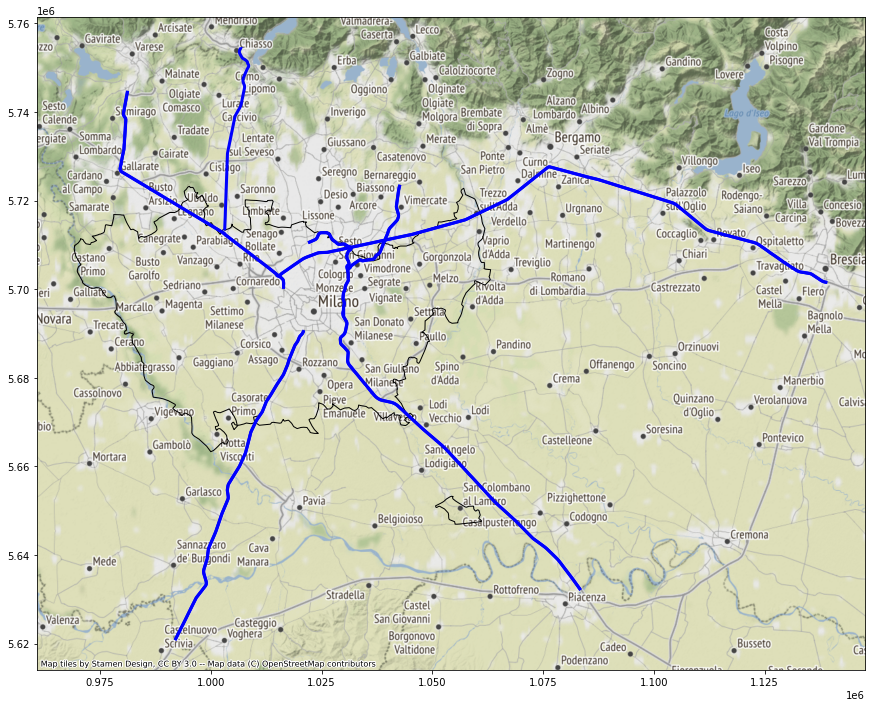

In [ ]:
provincia_selezionata = province3857[province3857["DEN_UTS"] == input("inserire una provincia: ")].geometry.item()
autostrade_provincia = autostrade3857[autostrade3857.crosses(provincia_selezionata)]
print("in questa provincia ci sono " + str(len(autostrade_provincia)) + " autostrade")
provincia_selezionata_serie = gpd.GeoSeries([provincia_selezionata])
ax = provincia_selezionata_serie.plot(figsize = (15, 12), edgecolor = "k", facecolor = "none")
autostrade_provincia.plot(ax=ax, edgecolor = "blue", linewidth = 3)
ctx.add_basemap(ax)

5. caricare il geodataframe delle regioni e visualizzare la Lombardia sulla mappa come nell'esempio

In [ ]:
regioni = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Reg01012022_g (1)")

In [ ]:
regioni3857 = regioni.to_crs(3857)

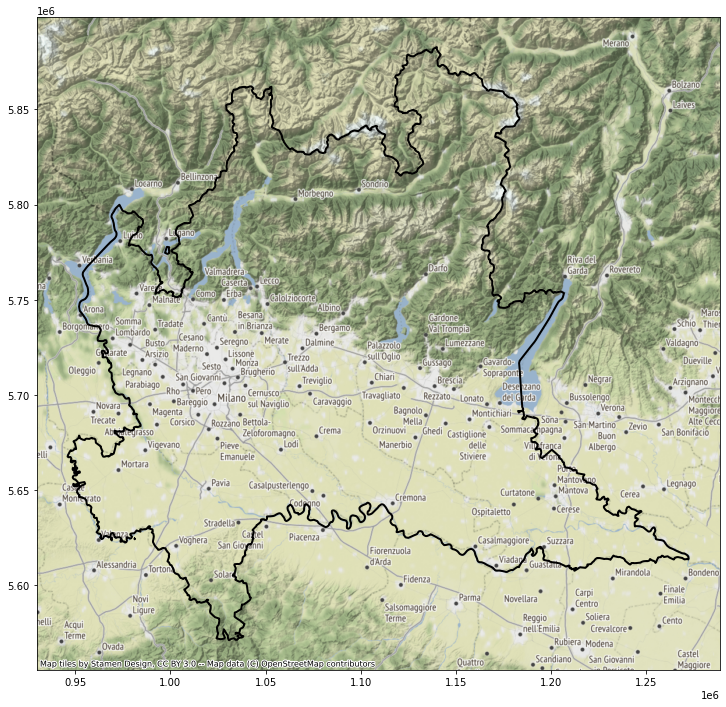

In [ ]:
lombardia = regioni3857[regioni3857["DEN_REG"] == "Lombardia"]
ax = lombardia.plot(figsize = (15, 12), edgecolor = "k", facecolor = "none", linewidth = 2)
ctx.add_basemap(ax)

6. visualizzare sia i confini delle Lombardia sia i confini delle province lombarde. Usare gli opportuni metodi di geopandas per trovare le province lombarde. Fare in modo che la visualizzazione sia uguale a quella proposta

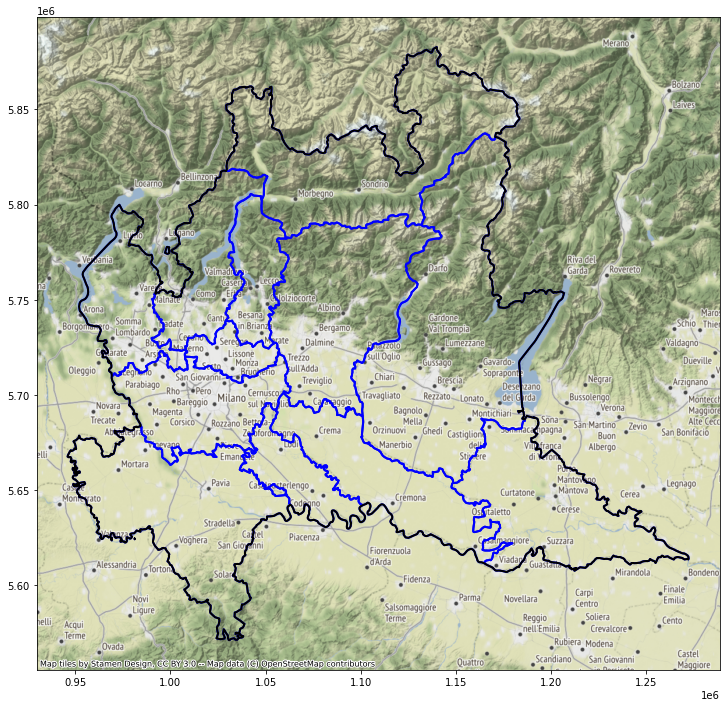

In [ ]:
province_lombarde = province3857[province3857.within(lombardia.geometry.item())]
ax = province_lombarde.plot(figsize = (15, 12), edgecolor = "blue", facecolor = "none", linewidth = 2)
lombardia.plot(ax=ax, edgecolor = "k", facecolor = "none", linewidth = 2)
ctx.add_basemap(ax)

7. visualizzare in rosso le province della Lombardia che sono attraversate da autostrade. Fare in mnodo che si possa vedere comunque la mappa della Lombardia.

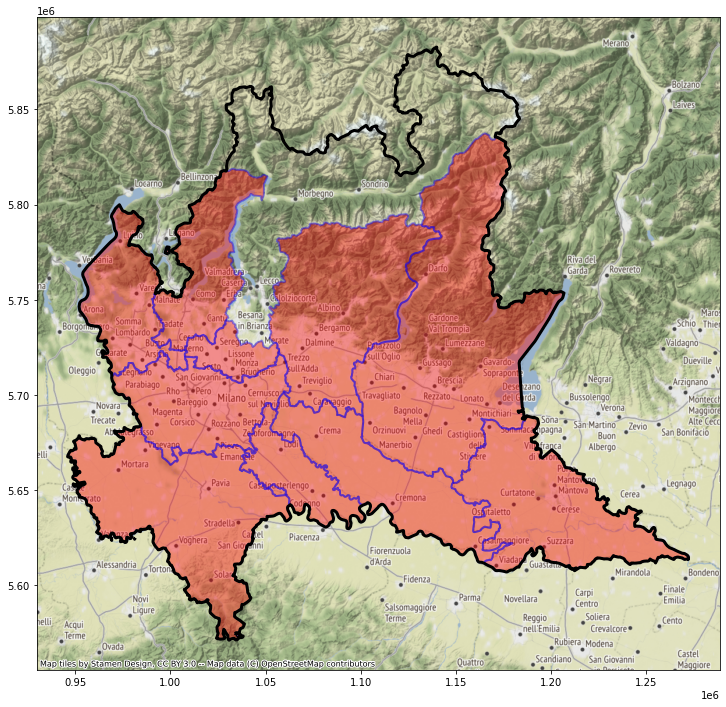

In [ ]:
province_lombarde_autostrade = province_lombarde[province_lombarde.intersects(autostrade3857.unary_union)]
ax = province_lombarde_autostrade.plot(figsize = (15, 12), edgecolor = "blue", facecolor = "red", linewidth = 2, alpha = 0.4)
lombardia.plot(ax=ax, edgecolor = "k", facecolor = "none", linewidth = 3)
ctx.add_basemap(ax)

8. visualizzare in verde le province della Lombardia che non sono attraversate da autostrade. Fare in mnodo che si possa vedere comunque la mappa.

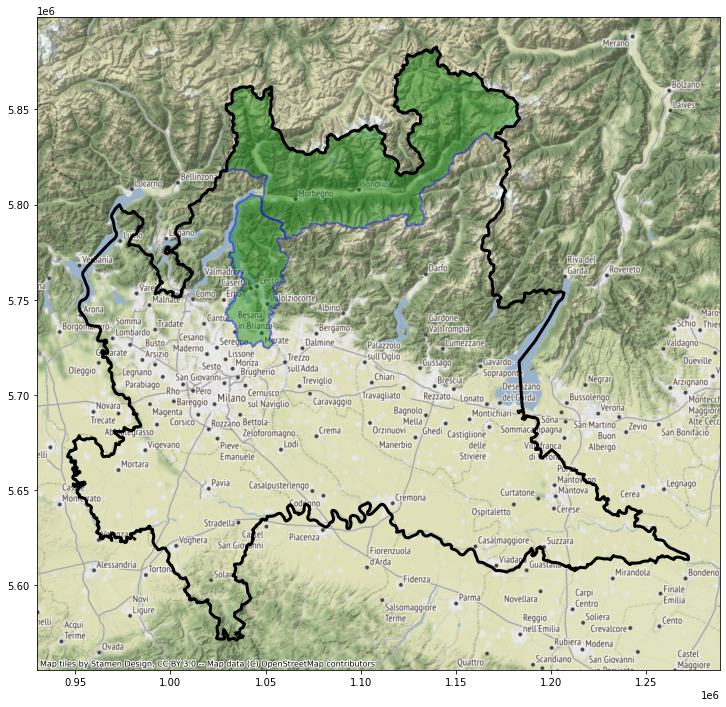

In [ ]:
province_lombarde_no_autostrade = province_lombarde[province_lombarde.intersects(autostrade3857.unary_union) == False]
ax = province_lombarde_no_autostrade.plot(figsize = (15, 12), edgecolor = "blue", facecolor = "green", linewidth = 2, alpha = 0.4)
lombardia.plot(ax=ax, edgecolor = "k", facecolor = "none", linewidth = 3)
ctx.add_basemap(ax)

9. aggiungere ad ogni autostrada le informazioni riguardanti la provincia lombarda che attraversa

In [ ]:
joined = gpd.sjoin(autostrade3857, province_lombarde, how="left", predicate="crosses")
joined

,TS_EID,COD_PE,PERCORSO,geometry,index_right,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area
0,19.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (996724.953 5619568.798, 996761.287...",17.0,1.0,3.0,18.0,0.0,18.0,Pavia,-,Pavia,PV,Provincia,449504.645144,2.967086e+09
1,18.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (1115798.586 5637375.872, 1116110.4...",18.0,1.0,3.0,19.0,0.0,19.0,Cremona,-,Cremona,CR,Provincia,365396.227730,1.769320e+09
1,18.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (1115798.586 5637375.872, 1116110.4...",16.0,1.0,3.0,17.0,0.0,17.0,Brescia,-,Brescia,BS,Provincia,446387.375203,4.787545e+09
2,21.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (1115808.858 5637362.965, 1116123.1...",18.0,1.0,3.0,19.0,0.0,19.0,Cremona,-,Cremona,CR,Provincia,365396.227730,1.769320e+09
2,21.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (1115808.858 5637362.965, 1116123.1...",16.0,1.0,3.0,17.0,0.0,17.0,Brescia,-,Brescia,BS,Provincia,446387.375203,4.787545e+09
3,65.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (1032727.031 5681074.338, 1032628.6...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,62.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (1008128.323 5708587.933, 1008170.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (1029432.552 5689221.811, 1029484.4...",14.0,1.0,3.0,15.0,215.0,215.0,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (1029432.552 5689221.811, 1029484.4...",103.0,1.0,3.0,108.0,0.0,108.0,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08
6,78.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (1029406.858 5689254.015, 1029450.4...",14.0,1.0,3.0,15.0,215.0,215.0,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09


10. visualizzare il numero di autostrade che sono presenti in ogni provincia. Ordinare in ordine decrescente sul numero di autostrade

In [ ]:
Nautostrade_per_provincia = joined.groupby("DEN_UTS").count()[["PERCORSO"]].sort_values(by="PERCORSO", ascending = False).reset_index()
Nautostrade_per_provincia

,DEN_UTS,PERCORSO
0,Milano,13
1,Monza e della Brianza,6
2,Brescia,4
3,Pavia,4
4,Varese,4
5,Bergamo,2
6,Como,2
7,Cremona,2
8,Lodi,2
9,Mantova,2


11. visualizzare una mappa con le diverse province lombarde colorate a seconda del numero di autostrade presenti, con una legenda che indichi il significato dei colori

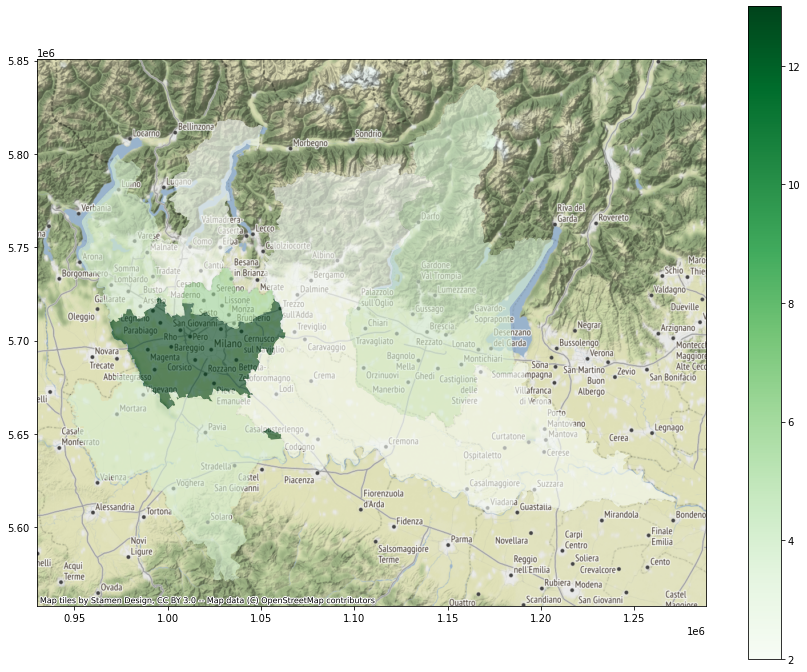

In [ ]:
finale = province_lombarde.merge(Nautostrade_per_provincia, on="DEN_UTS")
ax = finale.plot(figsize = (15, 12), column = "PERCORSO", legend = True, cmap="Greens", alpha = 0.6)
ctx.add_basemap(ax)

12. aggiungere alla mappa precedente anche le province che non sono attraversate da autostrade. Lasciarle trasparenti.

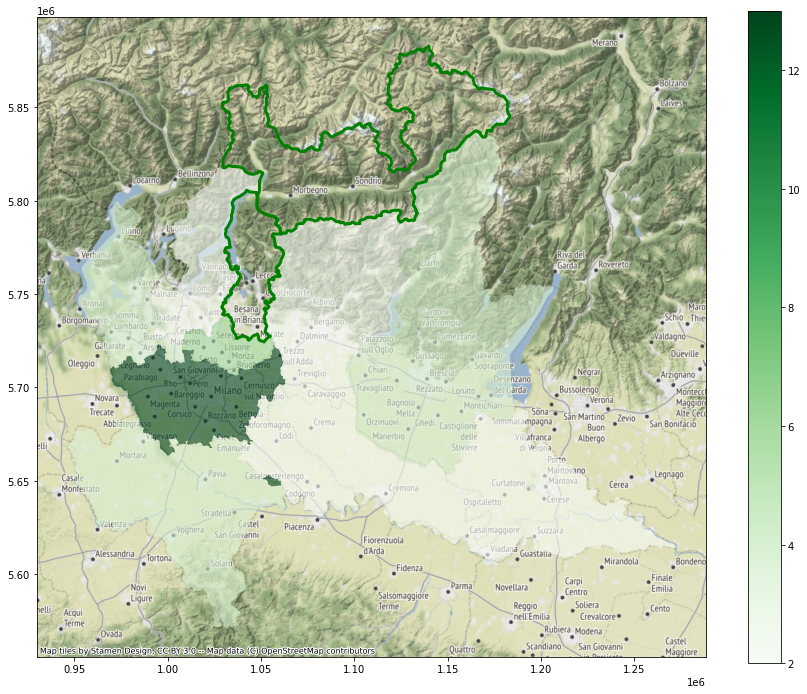

In [ ]:
finale = province_lombarde.merge(Nautostrade_per_provincia, on="DEN_UTS")
ax = finale.plot(figsize = (15, 12), column = "PERCORSO", legend = True, cmap="Greens", alpha = 0.6)
province_lombarde_no_autostrade.plot(ax = ax, facecolor = "none", edgecolor = "Green", linewidth = 3)
ctx.add_basemap(ax)

13. far inserire dall'utente il nome di un'autostrada e visualizzare tutte le autostrade che incontra

In [ ]:
autostrada_selezionata = autostrade3857[autostrade3857["PERCORSO"].str.contains(input("inserire un'autostrada: "))].unary_union
autostrade_che_incontra = autostrade3857[autostrade3857.intersects(autostrada_selezionata)]
autostrade_che_incontra

inserire un'autostrada: TANGENZIALE EST


,TS_EID,COD_PE,PERCORSO,geometry
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (1029432.552 5689221.811, 1029484.4..."
6,78.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (1029406.858 5689254.015, 1029450.4..."
7,7.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (1029432.552 5689221.811, 1029415.0..."
8,8.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (1029406.858 5689254.015, 1029394.3..."
16,1915.0,A4,AUTOSTRADA TORINO-TRIESTE,"LINESTRING (1015565.270 5703200.433, 1015626.2..."
17,1916.0,A4,AUTOSTRADA TORINO-TRIESTE,"LINESTRING (1015565.270 5703200.433, 1015599.6..."
23,104.0,A52,TANGENZIALE NORD DI MILANO,"LINESTRING (1030917.559 5703998.699, 1030927.6..."
24,106.0,A52,TANGENZIALE NORD DI MILANO,"LINESTRING (1030863.649 5704132.590, 1030844.5..."


14. aggiungere all'esercizio precedente anche la visualizzazione su mappa delle autostrade: rossa quella inserita, nere le altre

inserire un'autostrada: TANGENZIALE EST


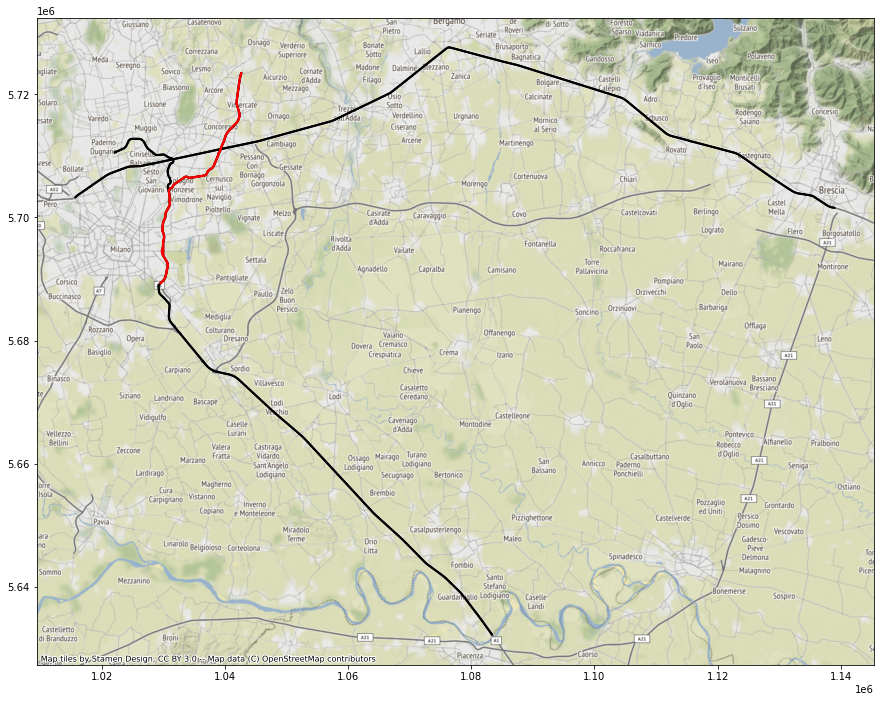

In [ ]:
autostrada_selezionata = autostrade3857[autostrade3857["PERCORSO"].str.contains(input("inserire un'autostrada: "))].unary_union
autostrade_che_incontra = autostrade3857[autostrade3857.intersects(autostrada_selezionata)]
autostrada_selezionata2 = gpd.GeoSeries([autostrada_selezionata])
ax = autostrade_che_incontra.plot(figsize = (15, 12), edgecolor = "k", linewidth = 2)
autostrada_selezionata2.plot(ax = ax, edgecolor = "red", linewidth = 2)
ctx.add_basemap(ax)

15. far inserire un punto della Lombardia all'utente e visualizzare l'autostrada più vicina

In [ ]:
from shapely.geometry import Point
punto = Point(9.17, 45.42)

In [ ]:
autostrade["Distance"] = autostrade.distance(punto)

In [ ]:
autostrada_vicina = autostrade[autostrade["Distance"] == autostrade["Distance"].min()]

In [ ]:
autostrada_vicina

,TS_EID,COD_PE,PERCORSO,geometry,Distance
22,17.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (496361.009 4981571.915, 496395.134...",5.006193e+06


16. visualizzare il punto e l'autostrada dell'esercizio precedente su una mappa

In [ ]:
punto_Serie = gpd.GeoSeries([punto], crs = 4326).to_crs(3857)

In [ ]:
autostrada_vicina3857 = autostrada_vicina.to_crs(3857)

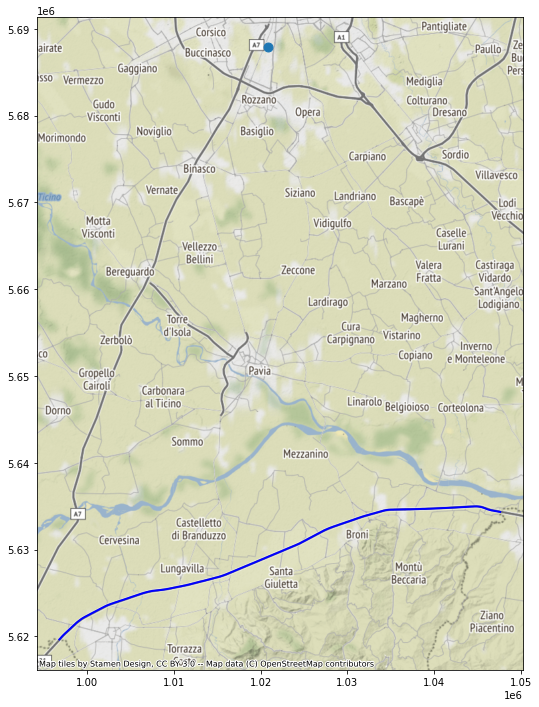

In [ ]:
ax = punto_Serie.plot(figsize = (15, 12), markersize = 80)
autostrada_vicina3857.plot(ax = ax, edgecolor = "blue", linewidth = 2)
ctx.add_basemap(ax)